In [171]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import cv2
import os
from pathlib import Path

import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, UpSampling2D, Concatenate, Input, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

from sklearn.model_selection import train_test_split

# Chargement des données

In [173]:
# Chargement des métadonnées
metadata = pd.read_csv('..\data\processed\metadata.csv')
metadata.head()

,FILE NAME,FORMAT,SIZE,IMAGE_URL,MASK_URL
0,COVID-1,PNG,299*299,.\data\processed\images\image-0.png,.\data\processed\masks\mask-0.png
1,COVID-2,PNG,299*299,.\data\processed\images\image-1.png,.\data\processed\masks\mask-1.png
2,COVID-3,PNG,299*299,.\data\processed\images\image-2.png,.\data\processed\masks\mask-2.png
3,COVID-4,PNG,299*299,.\data\processed\images\image-3.png,.\data\processed\masks\mask-3.png
4,COVID-5,PNG,299*299,.\data\processed\images\image-4.png,.\data\processed\masks\mask-4.png


In [174]:
# -------------------------------- A NE PAS COPIER DANS LE SCRIPT FINAL --------------------------------
# Ajout d'un . dans l'URL de l'image et du masque car le notebook est exécuté dans un sous-dossier

metadata["IMAGE_URL"] = metadata["IMAGE_URL"].apply(lambda x: "." + x)
metadata["MASK_URL"] = metadata["MASK_URL"].apply(lambda x: "." + x)

In [181]:
image_paths = metadata["IMAGE_URL"].values
mask_paths = metadata["MASK_URL"].values

In [182]:
# Séparation des données en ensembles d'entraînement, de validation et de test
X_train, X_test_valid, y_train, y_test_valid = train_test_split(image_paths, mask_paths, test_size=0.3, random_state=42)
X_test, X_valid, y_test, y_valid = train_test_split(X_test_valid, y_test_valid, test_size=0.5, random_state=42)

In [ ]:
def load_images(image_path, mask_path):
    """
    Load images and masks from the given paths.
    """
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=1)
    image = tf.cast(image, tf.float32) / 255.0
    image.set_shape((256, 256, 1))

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.cast(mask, tf.float32) / 255.0
    mask.set_shape((256, 256, 1))

    return image, mask

In [184]:
# Transformation des chemins d'images et de masques en dataset Tensorflow, puis application de la fonction de chargement
# de données sur chaque élément du dataset

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.map(lambda x, y: load_images(x, y),
                      num_parallel_calls=tf.data.AUTOTUNE)

val_ds = tf.data.Dataset.from_tensor_slices((X_valid, y_valid))
val_ds = val_ds.map(lambda x, y: load_images(x, y),
                      num_parallel_calls=tf.data.AUTOTUNE)

test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test))
test_ds = test_ds.map(lambda x, y: load_images(x, y),
                      num_parallel_calls=tf.data.AUTOTUNE)

In [185]:
# Mélange des données dans les datasets, 

BATCH_SIZE = 64

train_ds = (
    train_ds
    .shuffle(buffer_size=100)
    .batch(BATCH_SIZE)
    .prefetch(buffer_size=tf.data.AUTOTUNE)
)

val_ds = (
    val_ds
    .batch(BATCH_SIZE)
    .prefetch(buffer_size=tf.data.AUTOTUNE)
)

test_ds = (
    test_ds
    .batch(BATCH_SIZE)
    .prefetch(buffer_size=tf.data.AUTOTUNE)
)

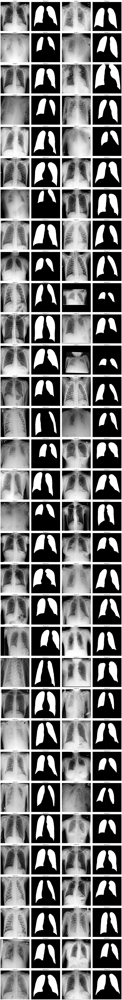

In [186]:
# Extraire un batch
images, masks = next(iter(train_ds))

# Afficher toutes les images du batch
batch_size = images.shape[0]

plt.figure(figsize=(20, batch_size * 2.5))
j = 0
for i in range(1, 2*batch_size, 2):
    plt.subplot(batch_size // 2, 4, i)
    plt.imshow(images[j].numpy(), cmap='gray')
    plt.axis('off')
    plt.title(f'Image {j}')

    plt.subplot(batch_size// 2, 4, i + 1)
    plt.imshow(masks[j].numpy(), cmap='gray')
    plt.axis('off')
    plt.title(f'Masque {j}')
    j += 1
    
plt.tight_layout()
plt.show()

In [187]:
# Les masques sont bien des images binaires, on peut vérifier les valeurs uniques
np.unique(masks[0].numpy())

array([0., 1.], dtype=float32)

# Modélisation

In [188]:
def down_block(x, filters):
    """
    Downsampling block for the U-Net model.
    """
    x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    p = MaxPooling2D((2, 2))(x)
    return x, p

def up_block(x, skip, filters):
    """
    Upsampling block for the U-Net model.
    """
    x = UpSampling2D((2, 2))(x)
    x = Concatenate()([x, skip])
    x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = Conv2D(filters, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    return x

def build_unet(input_shape):
    """
    Build the U-Net model.
    """
    inputs = Input(shape=input_shape)

    # Downsampling path
    temp1, x = down_block(inputs, 16)
    temp2, x = down_block(x, 32)
    temp3, x = down_block(x, 64)
    temp4, x = down_block(x, 128)

    # Bottleneck
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    bottleneck = BatchNormalization()(bottleneck)
    bottleneck = Conv2D(256, (3, 3), activation='relu', padding='same')(bottleneck)
    bottleneck = BatchNormalization()(bottleneck)

    # Upsampling path
    x = up_block(bottleneck, temp4, 128)
    x = up_block(x, temp3, 64)
    x = up_block(x, temp2, 32)
    x = up_block(x, temp1, 16)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(x)

    model = Model(inputs=[inputs], outputs=[outputs])
    model.summary()
    
    return model

In [189]:
# Définition des callbacks

model_path = r"..\models\unet_filters_c1_16.h5"

modelcheckpoint = ModelCheckpoint(filepath=model_path,
                                  monitor='val_mean_iou',
                                  verbose=1,
                                  save_best_only=True,
                                  mode="max")

earlystop = EarlyStopping(monitor="val_loss",
                          mode="min",
                          min_delta=0,
                          patience=8,
                          verbose=1,
                          restore_best_weights=True)

reducelr = ReduceLROnPlateau(monitor="loss",
                             min_lr=0.00001,
                             patience=4,
                             factor=0.5,
                             cooldown=2,
                             verbose=1)

In [190]:
# Construction du modèle U-Net
input_shape = (256, 256, 1)
unet = build_unet(input_shape)


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_138 (Conv2D) │ (None, 256, 256,  │        160 │ input_layer_12[0… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │         64 │ conv2d_138[0][0]  │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_139 (Conv2D) │ (None, 256, 256,  │      2,320 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │         64 │ conv2d_139[0][0]  │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_48    │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_140 (Conv2D) │ (None, 128, 128,  │      4,640 │ max_pooling2d_48… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_140[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_141 (Conv2D) │ (None, 128, 128,  │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_141[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_49    │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_142 (Conv2D) │ (None, 64, 64,    │     18,496 │ max_pooling2d_49… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_142[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_143 (Conv2D) │ (None, 64, 64,    │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_143[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_50    │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_144 (Conv2D) │ (None, 32, 32,    │     73,856 │ max_pooling2d_50

 Total params: 1,968,225 (7.51 MB)

 Trainable params: 1,965,281 (7.50 MB)

 Non-trainable params: 2,944 (11.50 KB)

In [191]:
# Compilation du modèle
unet.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', tf.keras.metrics.MeanIoU(num_classes=2)])

In [192]:
# Entraînement du modèle
history = unet.fit(train_ds,
                    validation_data=val_ds,
                    epochs=50,
                    callbacks=[modelcheckpoint, earlystop, reducelr],
                    verbose=1)

Epoch 1/50


c:\Users\antoi\MachineLearning\PROJET COVID19\Radiography_project_LungIsolation\.venv\lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_350']
Received: inputs=Tensor(shape=(None, None, None, 1))
  warnings.warn(msg)


232/232 ━━━━━━━━━━━━━━━━━━━━ 1203s 5s/step - accuracy: 0.9378 - loss: 0.2073 - mean_io_u: 0.3804 - val_accuracy: 0.8095 - val_loss: 0.4497 - val_mean_io_u: 0.3801 - learning_rate: 0.0010
Epoch 2/50


c:\Users\antoi\MachineLearning\PROJET COVID19\Radiography_project_LungIsolation\.venv\lib\site-packages\keras\src\callbacks\model_checkpoint.py:209: UserWarning: Can save best model only with val_mean_iou available, skipping.
  self._save_model(epoch=epoch, batch=None, logs=logs)


232/232 ━━━━━━━━━━━━━━━━━━━━ 1043s 4s/step - accuracy: 0.9885 - loss: 0.0349 - mean_io_u: 0.3804 - val_accuracy: 0.9647 - val_loss: 0.0888 - val_mean_io_u: 0.3801 - learning_rate: 0.0010
Epoch 3/50
232/232 ━━━━━━━━━━━━━━━━━━━━ 1042s 4s/step - accuracy: 0.9905 - loss: 0.0251 - mean_io_u: 0.3992 - val_accuracy: 0.9856 - val_loss: 0.0372 - val_mean_io_u: 0.4702 - learning_rate: 0.0010
Epoch 4/50
232/232 ━━━━━━━━━━━━━━━━━━━━ 1041s 4s/step - accuracy: 0.9920 - loss: 0.0203 - mean_io_u: 0.4972 - val_accuracy: 0.9904 - val_loss: 0.0250 - val_mean_io_u: 0.5823 - learning_rate: 0.0010
Epoch 5/50
 33/232 ━━━━━━━━━━━━━━━━━━━━ 14:16 4s/step - accuracy: 0.9929 - loss: 0.0178 - mean_io_u: 0.6046

KeyboardInterrupt: 